In [1]:
# Import necssary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,roc_auc_score,plot_roc_curve,roc_curve,r2_score
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load dataset and convert into dataframe
data = pd.read_csv('temperature[1].csv')
#Looking into first 5 rows
data.head() 

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
# display Maximum rows
pd.set_option('display.max.rows',None)

In [4]:
# Checking columns name
data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [5]:
# Checking shape of dataset
data.shape

(7752, 25)

In [6]:
# Dataset Have 7752 Rows and 25 Columns

In [7]:
#Checking the datatype of each attribute
data.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [8]:
# Identifing the type of Problem- Output:Next_Tmax, Next_Tmin, is float data so we use Regression models

In [9]:
#removing duplicate values
data.drop_duplicates(inplace = True)

In [10]:
# Checking  shape After removing Duplicated
data.shape

(7752, 25)

In [11]:
# Dataset have no duplicate values

In [12]:
# Checking Null values of each attributes
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [13]:
# Checking missing values of each attributes
data.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

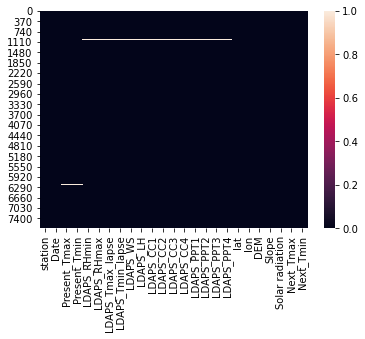

In [14]:
#Looking for missing value
sns.heatmap(data.isna())
plt.show()

In [15]:
# Missing Values present in the dataset except, lat,lon,DEM,Slope,Solar radiation,

In [16]:
# Checking statistics summary
data.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [17]:
#The mean and 50% values are similar for almost all the columns. and not much difference between 75% and max for most of the columns.

In [18]:
float_data=[]
for i in data.columns:
    if data[i].dtypes == "float64":
        float_data.append(i)
float_data

['station',
 'Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'LDAPS_PPT1',
 'LDAPS_PPT2',
 'LDAPS_PPT3',
 'LDAPS_PPT4',
 'lat',
 'lon',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

In [19]:
# Create a missing attribute list
float_dtypes=['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin','LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS','LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4','LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','Next_Tmax', 'Next_Tmin']

In [20]:
#Now deal with missing value
for i in float_dtypes:
    if data[i].mean()>data[i].median():
        data[i]=data[i].fillna(data[i].mean())
    else:
        data[i]=data[i].fillna(data[i].median())

In [21]:
# Now deal with object data type:
data['Date']=data['Date'].fillna(data['Date'].mode()[0])

In [22]:
# Spliting date into day,month and year
data['day']=data['Date'].str.split('-').str[0].astype('int')
data['month']=data['Date'].str.split('-').str[1].astype('int')
data['year']=data['Date'].str.split('-').str[2].astype('int')

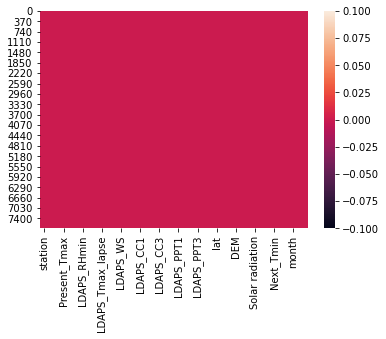

In [23]:
# Checking again missing value
sns.heatmap(data.isna())
plt.show()

In [24]:
# There no null value present in dataset

In [25]:
# Drop date column
data.drop('Date',axis=1,inplace=True)

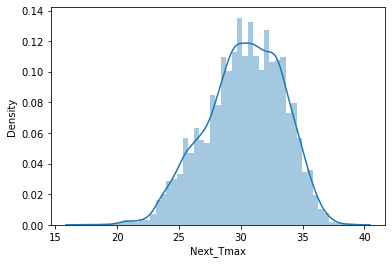

In [26]:
sns.distplot(data['Next_Tmax'])
plt.show()

In [27]:
# Next-day maximum air temperature (Â°C) is majorly in the range of 27.5 Â°C - 32.5 Â°C.

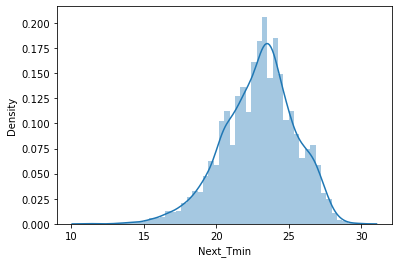

In [28]:
sns.distplot(data['Next_Tmin'])
plt.show()

In [29]:
# Next-day minimum air temperature (Â°C) is majorly in the range of 21.0 Â°C - 26.0 Â°C.

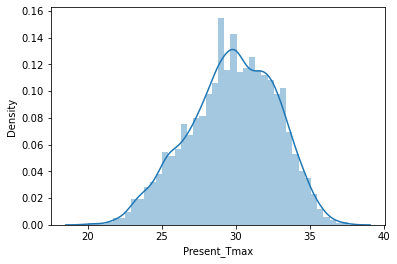

In [30]:
sns.distplot(data['Present_Tmax'])
plt.show()

In [31]:
#Maximum air temperature between 0 and 21 h on the present day (Â°C) is majorly in the range of 29 Â°C-32 Â°C.

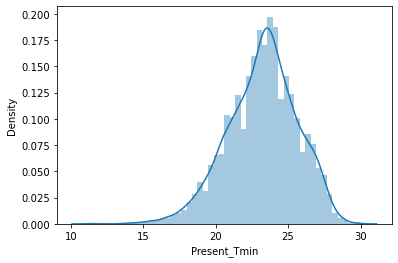

In [32]:
sns.distplot(data['Present_Tmin'])
plt.show()

In [33]:
#Minimum air temperature between 0 and 21 h on the present day (Â°C) is majorly in the range of 23 Â°C-25 Â°C.

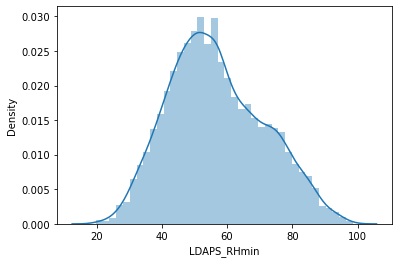

In [34]:
sns.distplot(data['LDAPS_RHmin'])
plt.show()

In [35]:
#LDAPS model forecast of next-day minimum relative humidity (%) is majorly in the range of 40 % - 60 %.

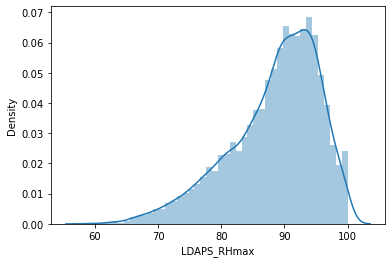

In [36]:
sns.distplot(data['LDAPS_RHmax'])
plt.show()

In [37]:
#LDAPS model forecast of next-day maximum relative humidity (%) is majorly in the range of 85 % - 96 %.

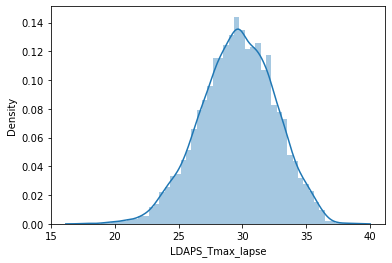

In [38]:
sns.distplot(data['LDAPS_Tmax_lapse'])
plt.show()

In [39]:
#LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C) is majorly in the range of 27 Â°C - 33 Â°C.

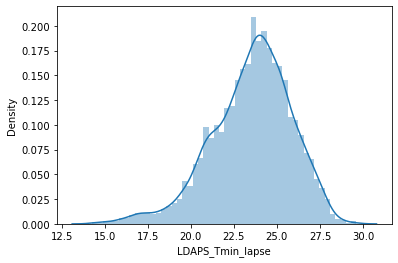

In [40]:
sns.distplot(data['LDAPS_Tmin_lapse'])
plt.show()

In [41]:
#LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C) is majorly in the range of 22.5 Â°C - 26.2 Â°C.

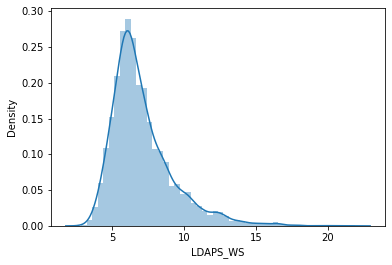

In [42]:
sns.distplot(data['LDAPS_WS'])
plt.show()

In [43]:
#LDAPS model forecast of next-day average wind speed (m/s) is majorly in the range of 5.0 m/s - 7.5 m/s.

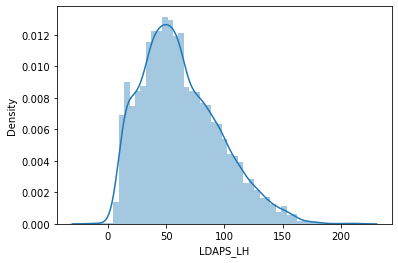

In [44]:
sns.distplot(data['LDAPS_LH'])
plt.show()

In [45]:
#LDAPS model forecast of next-day average latent heat flux (W/m2) is majorly in the range of 25 W/m2 - 75 W/m2.

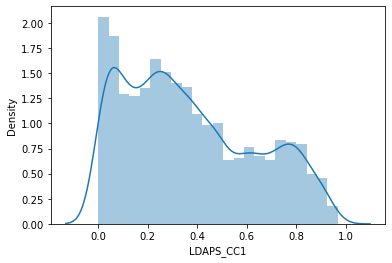

In [46]:
sns.distplot(data['LDAPS_CC1'])
plt.show()

In [47]:
#LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) is majorly in the range of 0.0 % - 0.4 %.

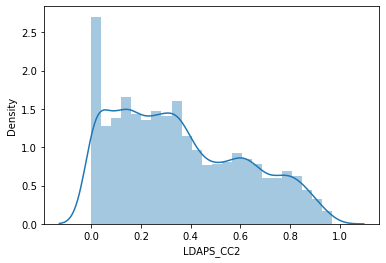

In [48]:
sns.distplot(data['LDAPS_CC2'])
plt.show()

In [49]:
#LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%) is majorly in the range of 0.0 % - 0.4 %.

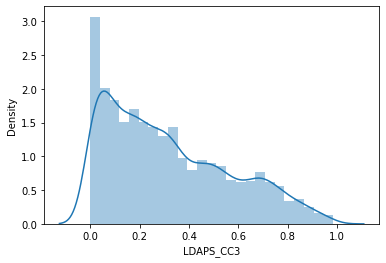

In [50]:
sns.distplot(data['LDAPS_CC3'])
plt.show()

In [51]:
#LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%) is majorly in the range of 0.0 % - 0.2 %.

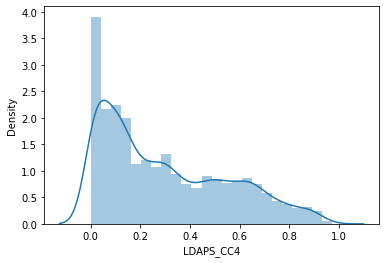

In [52]:
sns.distplot(data['LDAPS_CC4'])
plt.show()

In [53]:
#LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%) is majorly in the range of 0.0 % - 0.2 %.

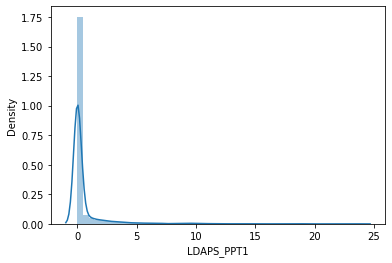

In [54]:
sns.distplot(data['LDAPS_PPT1'])
plt.show()

In [55]:
#LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%) is majorly in the range of 0.0 % - 1.0 %.

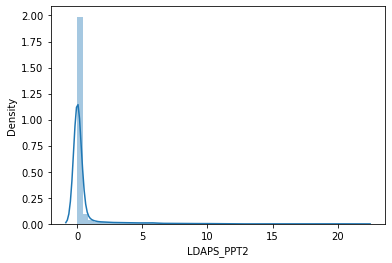

In [56]:
sns.distplot(data['LDAPS_PPT2'])
plt.show()

In [57]:
#LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%) is majorly in the range of 0.0 % - 1.0 %.

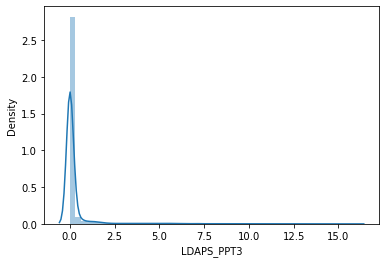

In [58]:
sns.distplot(data['LDAPS_PPT3'])
plt.show()

In [59]:
 #LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%) is majorly in the range of 0.0 % - 1 %.

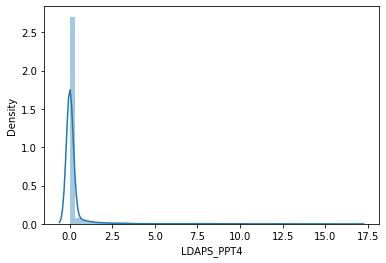

In [60]:
sns.distplot(data['LDAPS_PPT4'])
plt.show()

In [61]:
#LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%) is majorly in the range of 0.0 % - 1.0 %.

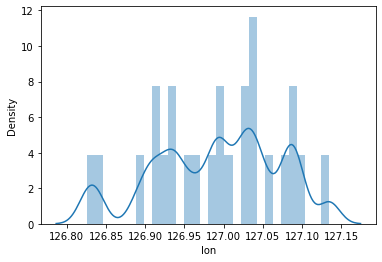

In [62]:
sns.distplot(data['lon'])
plt.show()

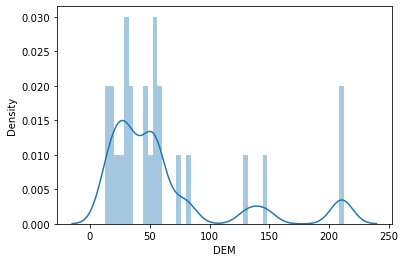

In [63]:
sns.distplot(data['DEM'])
plt.show()

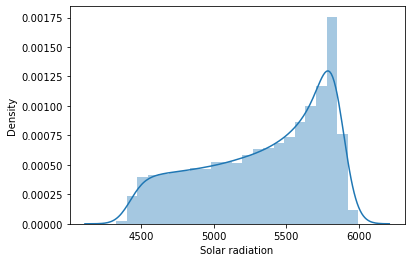

In [64]:
sns.distplot(data['Solar radiation'])
plt.show()

In [65]:
#Daily incoming solar radiation (wh/m2) is majorly in the range of 5500 wh/m2 - 6000 wh/m2.

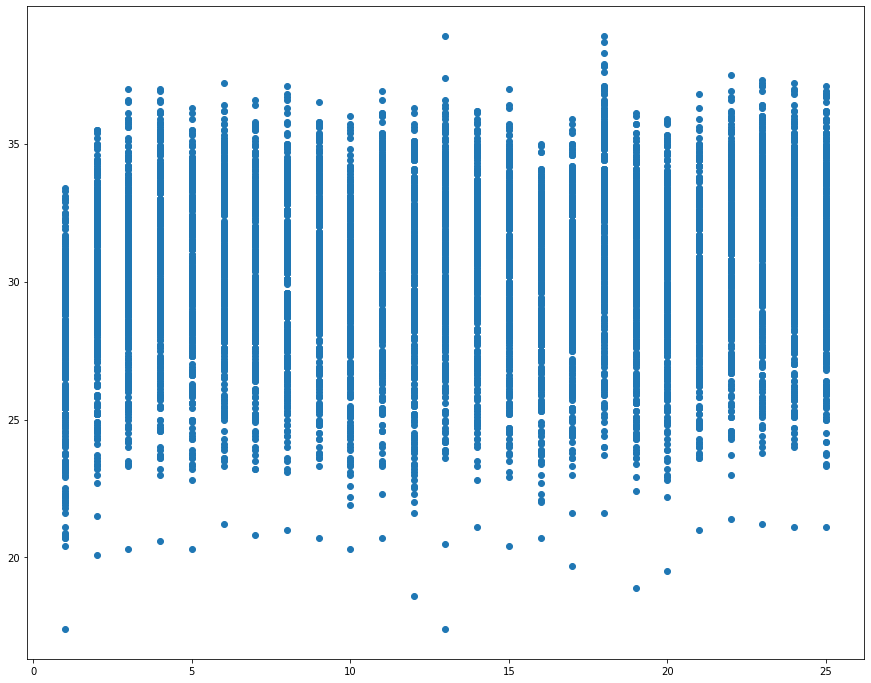

In [66]:
plt.figure(figsize=(15,12), facecolor='white')
plt.scatter(x=data['station'],y=data['Next_Tmax'])
plt.show()

In [67]:
#Next-day maximum air temperature is highest for station number 13th and 18th, and maximum_low for station number 1

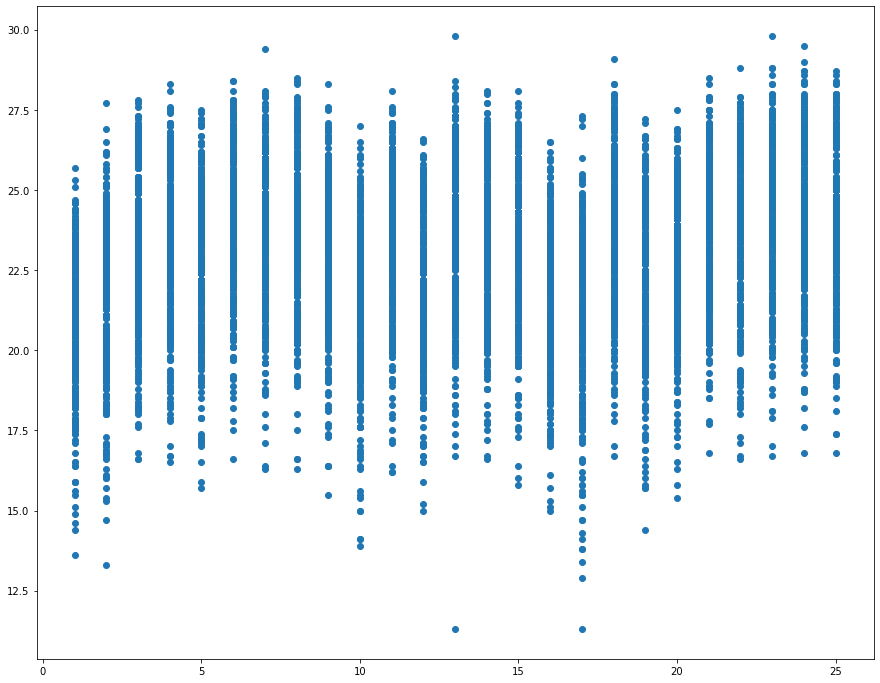

In [68]:
plt.figure(figsize=(15,12), facecolor='white')
plt.scatter(x=data['station'],y=data['Next_Tmin'])
plt.show()

In [69]:
# Next-day minimum air temperature is highest for station number 13 & 23,lowest for station number 1

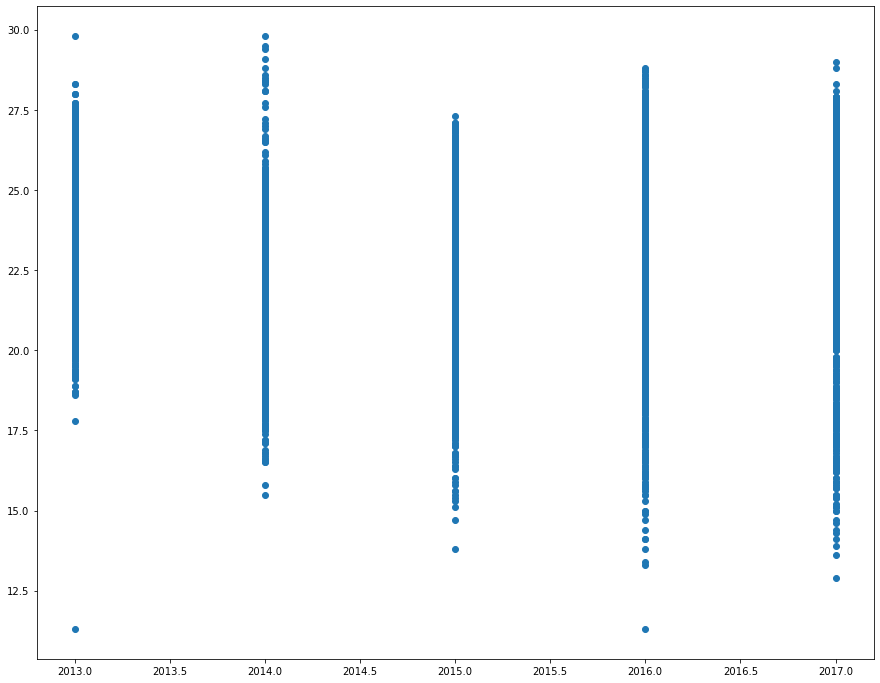

In [70]:
plt.figure(figsize=(15,12), facecolor='white')
plt.scatter(x=data['year'],y=data['Next_Tmin'])
plt.show()

In [71]:
#Next-day minimum air temperature is highest in the year 2013 and 2014,#& lowest in the year 2015.

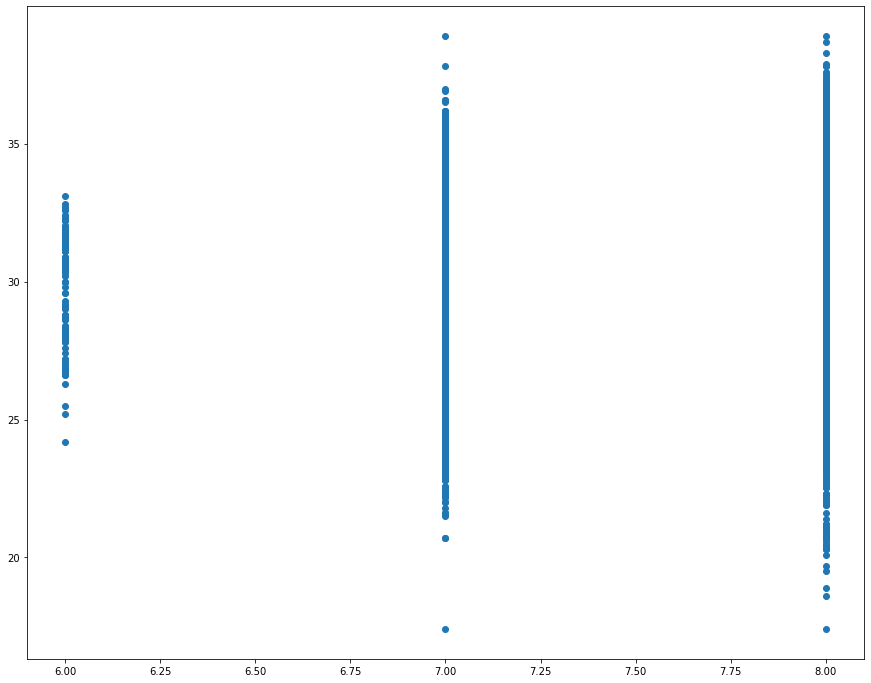

In [72]:
plt.figure(figsize=(15,12), facecolor='white')
plt.scatter(x=data['month'],y=data['Next_Tmax'])
plt.show()

In [73]:
#Next-day minimum air temperature is highest in the month of July and August,lowest in the month of June

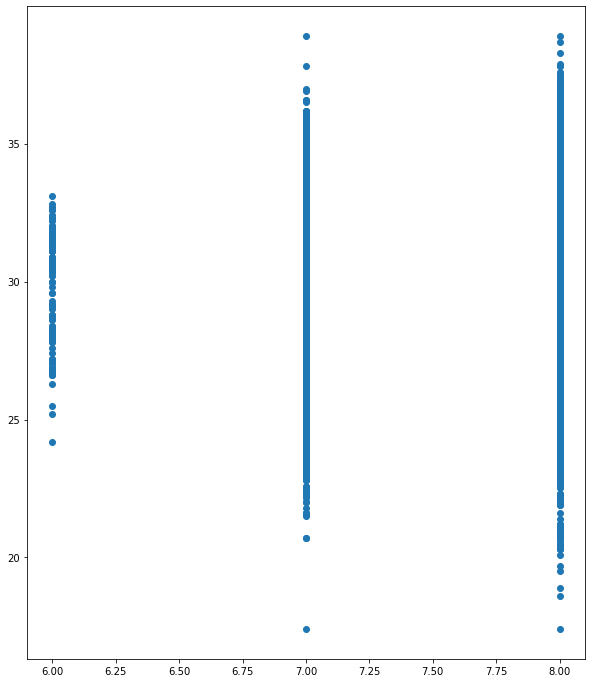

In [74]:
plt.figure(figsize=(10,12), facecolor='white')
plt.scatter(x=data['month'],y=data['Next_Tmax'])
plt.show()

In [75]:
#Next-day maximum air temperature is highest in the month of July and August,and lowest in the month of June.

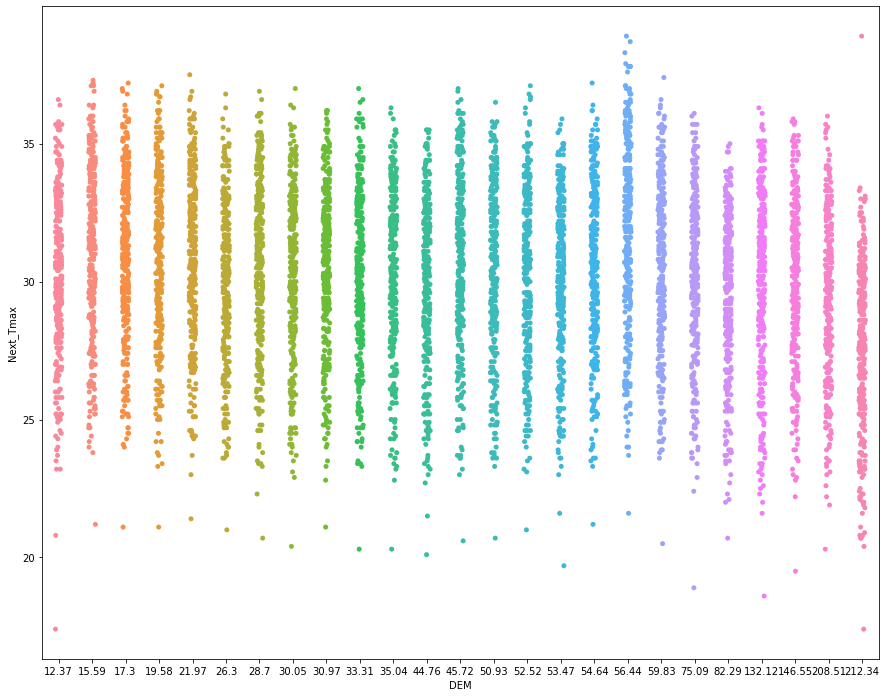

In [76]:
plt.figure(figsize=(15,12))
data['DEM']=data['DEM'].round(2)
sns.stripplot(data['DEM'],data['Next_Tmax'])
plt.show()

In [77]:
#Next-day maximum air temperature is highest on 56.44 ,lowest on 82.29

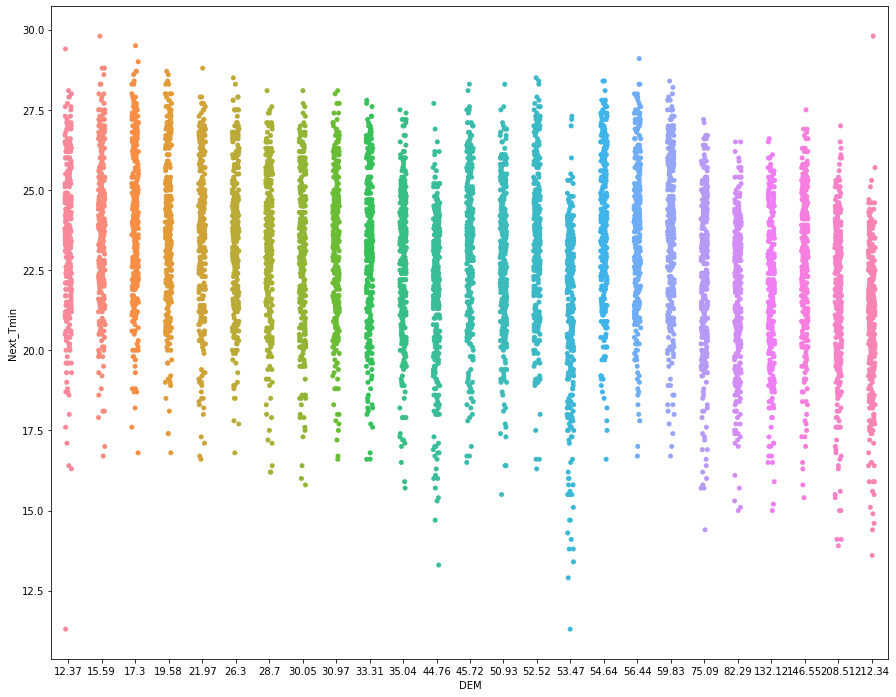

In [78]:
plt.figure(figsize=(15,12))
data['DEM']=data['DEM'].round(2)
sns.stripplot(data['DEM'],data['Next_Tmin'])
plt.show()

In [79]:
#Next-day minimum air temperature is highest on 15.59 and 212.34 elevation,lowest on 82.29 and 132.12 elevation.

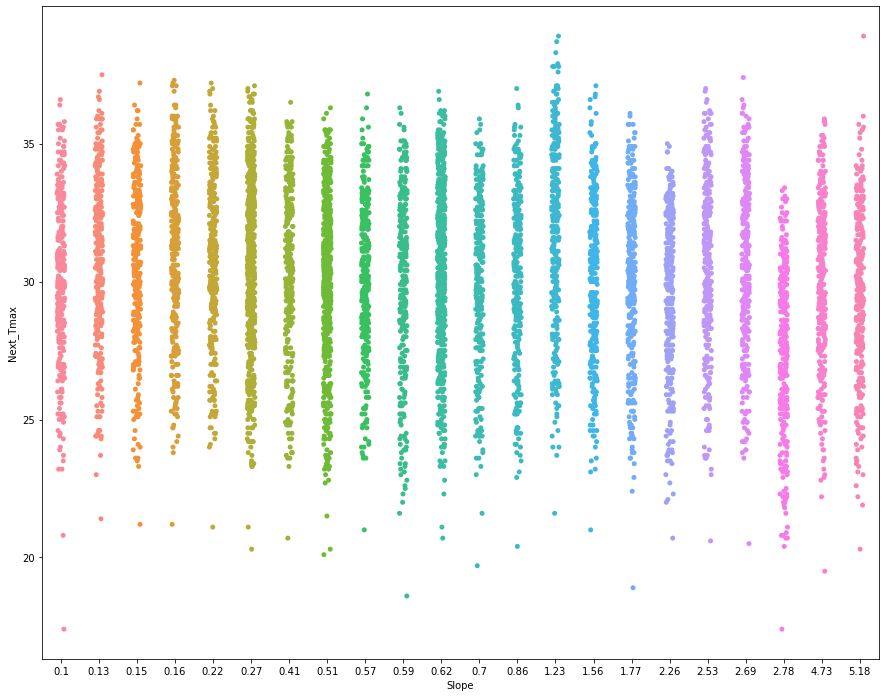

In [80]:
plt.figure(figsize=(15,12))
data['Slope']=data['Slope'].round(2)
sns.stripplot(data['Slope'],data['Next_Tmax'])
plt.show()

In [81]:
#Next-day maximum air temperature is highest for 1.23 Â° & lowest for 2.78 Â° slope.

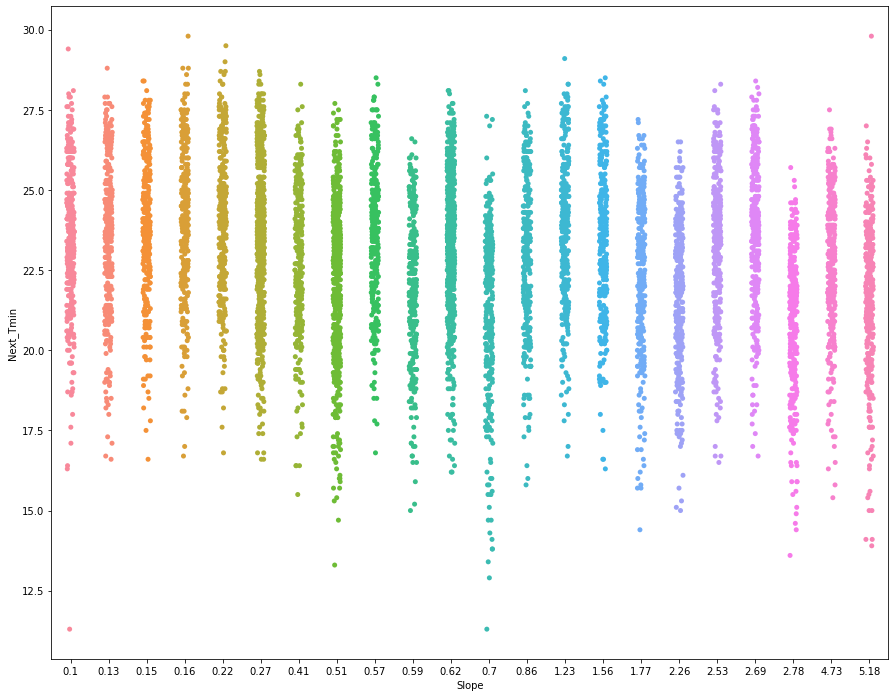

In [82]:
plt.figure(figsize=(15,12))
data['Slope']=data['Slope'].round(2)
sns.stripplot(data['Slope'],data['Next_Tmin'])
plt.show()

In [83]:
#Next-day minimum air temperature is highest for  0.16 Â° and 5.18 Â°,lowest for 2.78 Â° slope.

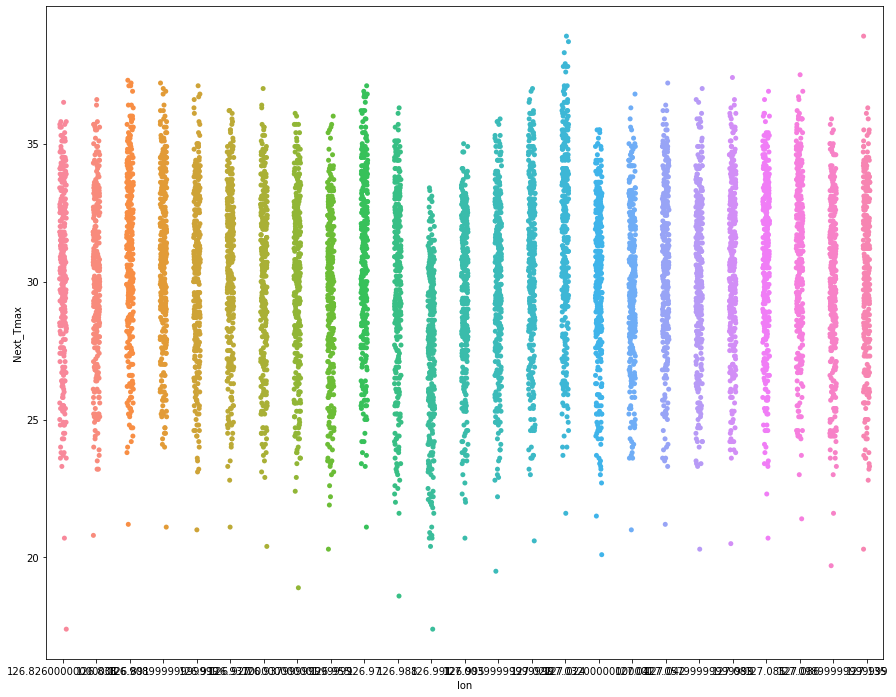

In [84]:
plt.figure(figsize=(15,12))
sns.stripplot(data['lon'],data['Next_Tmax'])
plt.show()

In [85]:
#Next-day maximum air temperature is highest for 127.02 Â°& 127.14 Â°,lowest for 127.03 Â° longitudes..

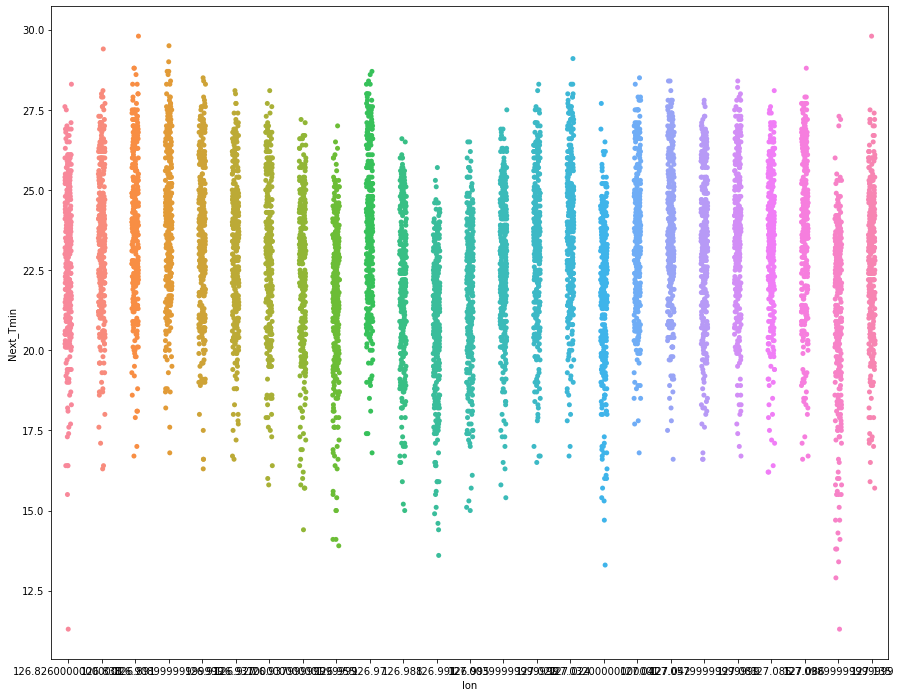

In [86]:
plt.figure(figsize=(15,12))
sns.stripplot(data['lon'],data['Next_Tmin'])
plt.show()

In [87]:
#Next-day maximum air temperature is highest for 126.89 Â° & 127.14 Â°, lowest for 126.99 Â° longitudes..

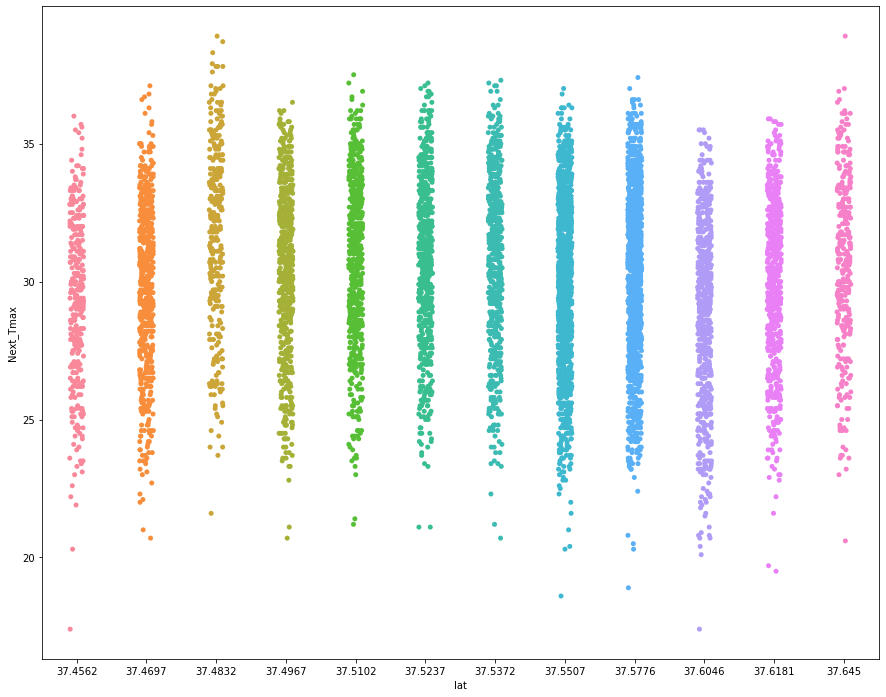

In [88]:
plt.figure(figsize=(15,12))
sns.stripplot(data['lat'],data['Next_Tmax'])
plt.show()

In [89]:
#Next-day minimum air temperature is highest for 37.645 Â°,lowest for 37.6046 Â° latitudes.

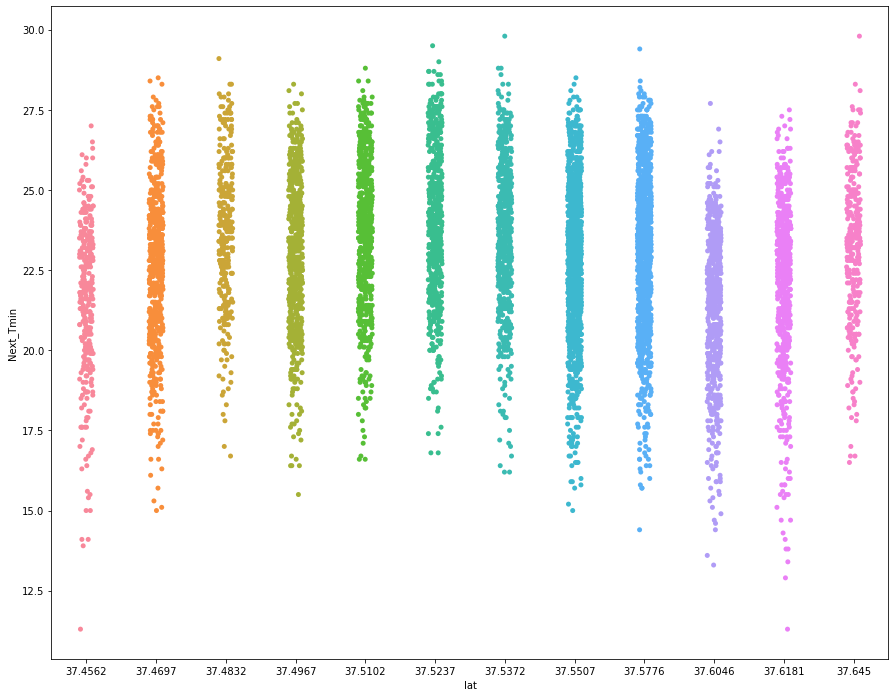

In [90]:
plt.figure(figsize=(15,12))
sns.stripplot(data['lat'],data['Next_Tmin'])
plt.show()

In [91]:
#Next-day minimum air temperature is highest for 37.5372 Â° and 37.645 Â° ,lowest for 37.4562 Â° latitudes.

In [92]:
cor = data.corr()
cor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,day,month,year
station,1.000000e+00,0.112582,0.131525,-0.066733,-0.166953,0.069107,0.104753,0.005277,-0.133357,0.006919,...,-0.237502,-0.118704,-0.255844,-0.089817,-0.019001,0.107900,0.128216,2.850282e-19,1.485726e-16,0.000000
Present_Tmax,1.125819e-01,1.000000,0.618769,-0.204518,-0.300261,0.570287,0.624229,-0.121804,0.135427,-0.311794,...,-0.052659,0.008990,-0.187141,-0.105790,-0.025401,0.610256,0.622700,-1.416512e-01,1.459488e-01,0.060095
Present_Tmin,1.315245e-01,0.618769,1.000000,0.123224,-0.012659,0.464420,0.764239,-0.034651,-0.009314,0.084458,...,-0.078547,-0.043509,-0.250299,-0.146377,0.053638,0.471723,0.796657,-1.055769e-01,8.745132e-02,0.038096
LDAPS_RHmin,-6.673316e-02,-0.204518,0.123224,1.000000,0.579032,-0.564578,0.089471,0.294361,-0.070858,0.613818,...,0.087099,-0.076237,0.102114,0.123638,0.244080,-0.437807,0.095101,-6.318427e-02,-1.890234e-01,-0.002104
LDAPS_RHmax,-1.669531e-01,-0.300261,-0.012659,0.579032,1.000000,-0.373274,-0.113914,0.135308,0.238534,0.436570,...,0.195761,0.025662,0.177132,0.219362,0.148259,-0.281282,-0.070193,-1.356682e-02,-1.167724e-01,-0.141314
LDAPS_Tmax_lapse,6.910687e-02,0.570287,0.464420,-0.564578,-0.373274,1.000000,0.654013,-0.311994,0.048010,-0.438437,...,-0.042093,0.090665,-0.178894,-0.162234,0.047820,0.827473,0.587066,-1.589482e-01,9.756185e-02,0.016358
LDAPS_Tmin_lapse,1.047525e-01,0.624229,0.764239,0.089471,-0.113914,0.654013,1.000000,-0.130028,-0.134753,0.010900,...,-0.096252,-0.026700,-0.195444,-0.185717,0.159445,0.588224,0.881074,-1.718675e-01,2.392268e-02,-0.004447
LDAPS_WS,5.277000e-03,-0.121804,-0.034651,0.294361,0.135308,-0.311994,-0.130028,1.000000,0.006711,0.289445,...,0.036657,-0.059466,0.191054,0.171504,0.121759,-0.342689,-0.096540,-4.172461e-02,-1.121275e-01,-0.112214
LDAPS_LH,-1.333566e-01,0.135427,-0.009314,-0.070858,0.238534,0.048010,-0.134753,0.006711,1.000000,-0.147296,...,0.133221,0.025822,0.055129,0.086770,-0.047384,0.157692,-0.055367,-2.127868e-02,6.562730e-02,0.056656
LDAPS_CC1,6.918787e-03,-0.311794,0.084458,0.613818,0.436570,-0.438437,0.010900,0.289445,-0.147296,1.000000,...,-0.008131,-0.006843,-0.014090,-0.020730,0.218309,-0.452458,-0.010953,-2.547655e-02,-2.095374e-01,-0.066621


In [93]:
# we can understanding properly as we use heatmap to find correleation

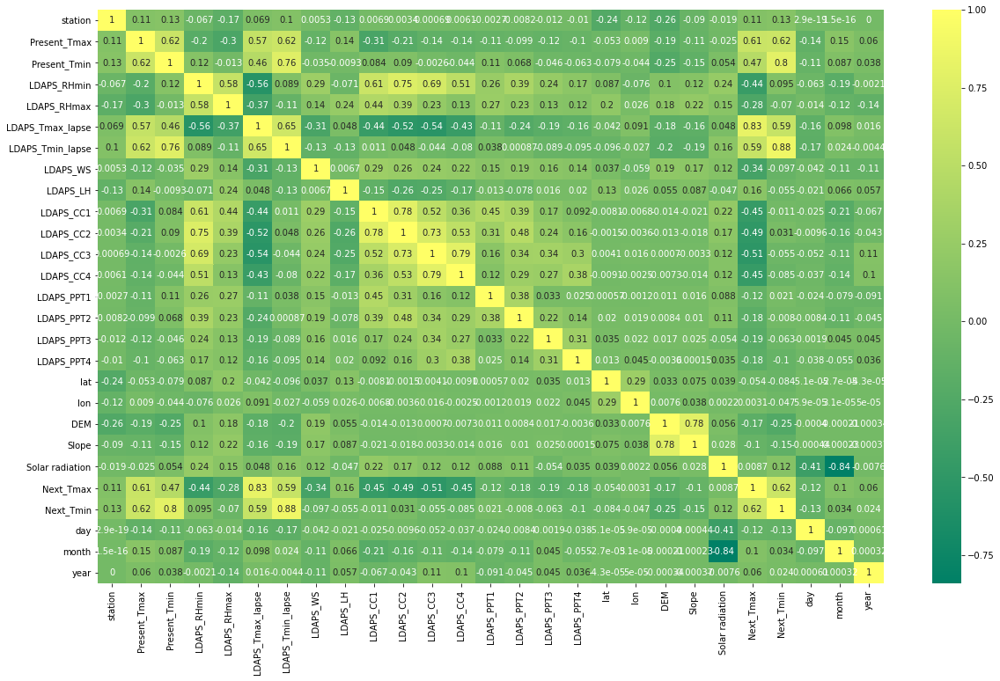

In [94]:
plt.figure(figsize=(20,12))
sns.heatmap(cor,annot= True,cmap='summer')
plt.show()

In [95]:
# Next_Tmax have correlationship with present_Tmax,present_Tmin

In [96]:
# We can not understand properly because graph are too small

In [97]:
data.shape

(7752, 27)

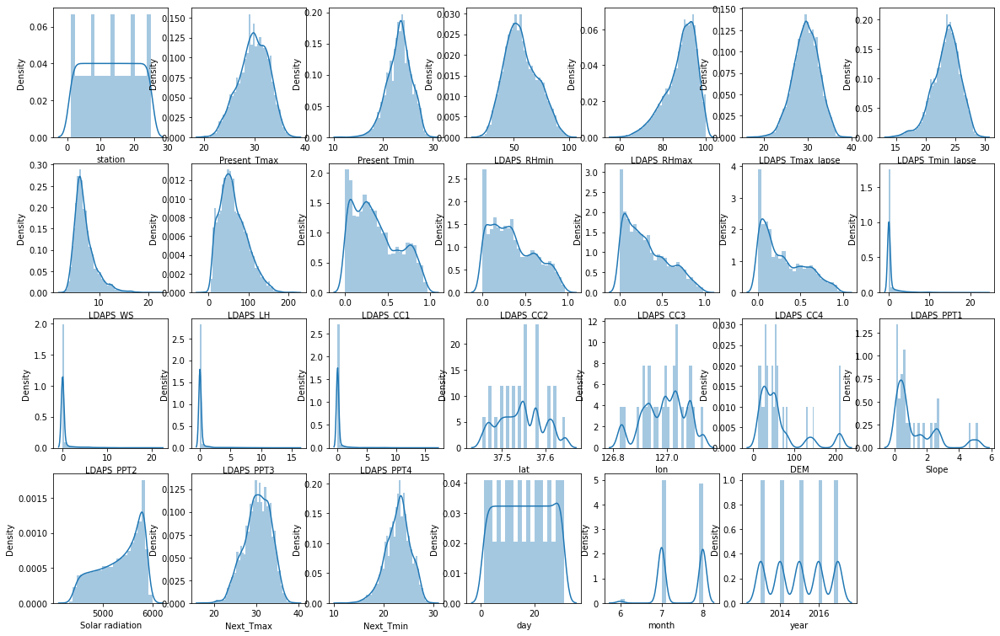

In [98]:
# Chekcing Outlier and skeweness
# let's see how data is distributed for every column
plt.figure(figsize=(20,13), facecolor='white')
plotnumber = 1

for columns in data:
    if plotnumber<=28 :     # as there are 28 columns in the data
        ax = plt.subplot(4,7,plotnumber)
        sns.distplot(data[columns])
    plotnumber+=1
plt.show()

In [99]:
# Skewness and outlier are present in datset

In [100]:
# Checking Skewness
data.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.300220
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.579236
LDAPS_LH            0.673757
LDAPS_CC1           0.459458
LDAPS_CC2           0.472350
LDAPS_CC3           0.640735
LDAPS_CC4           0.666482
LDAPS_PPT1          5.393821
LDAPS_PPT2          5.775355
LDAPS_PPT3          6.457129
LDAPS_PPT4          6.825464
lat                 0.087062
lon                -0.285213
DEM                 1.723336
Slope               1.564483
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
day                -0.008839
month              -0.195325
year                0.000365
dtype: float64

In [101]:
# Removing ouliter using Z score
from scipy.stats import zscore
z = np.abs(zscore(data))
print(np.where(z>3))

(array([  25,   25,   26, ..., 7751, 7751, 7751], dtype=int64), array([ 7, 14, 14, ..., 14, 15, 16], dtype=int64))


In [102]:
threshold= 3
new_data=data[(z<3).all(axis=1)]
print(data.shape)
print(new_data.shape)

(7752, 27)
(6894, 27)


In [103]:
# data loss
loss =((7752-6894)/7752)*100
loss

11.06811145510836

In [104]:
new_data.skew()

station             0.002792
Present_Tmax       -0.273950
Present_Tmin       -0.227590
LDAPS_RHmin         0.305740
LDAPS_RHmax        -0.694148
LDAPS_Tmax_lapse   -0.110448
LDAPS_Tmin_lapse   -0.386322
LDAPS_WS            1.087781
LDAPS_LH            0.568781
LDAPS_CC1           0.593990
LDAPS_CC2           0.500911
LDAPS_CC3           0.700217
LDAPS_CC4           0.710930
LDAPS_PPT1          3.731226
LDAPS_PPT2          4.843672
LDAPS_PPT3          5.482625
LDAPS_PPT4          5.927822
lat                 0.108251
lon                -0.275508
DEM                 1.764112
Slope               1.595059
Solar radiation    -0.505353
Next_Tmax          -0.270929
Next_Tmin          -0.238547
day                 0.001007
month              -0.192910
year                0.010998
dtype: float64

In [105]:
# we  accept the skewness between -.5 to +.5 and we ignore object dtype skweness

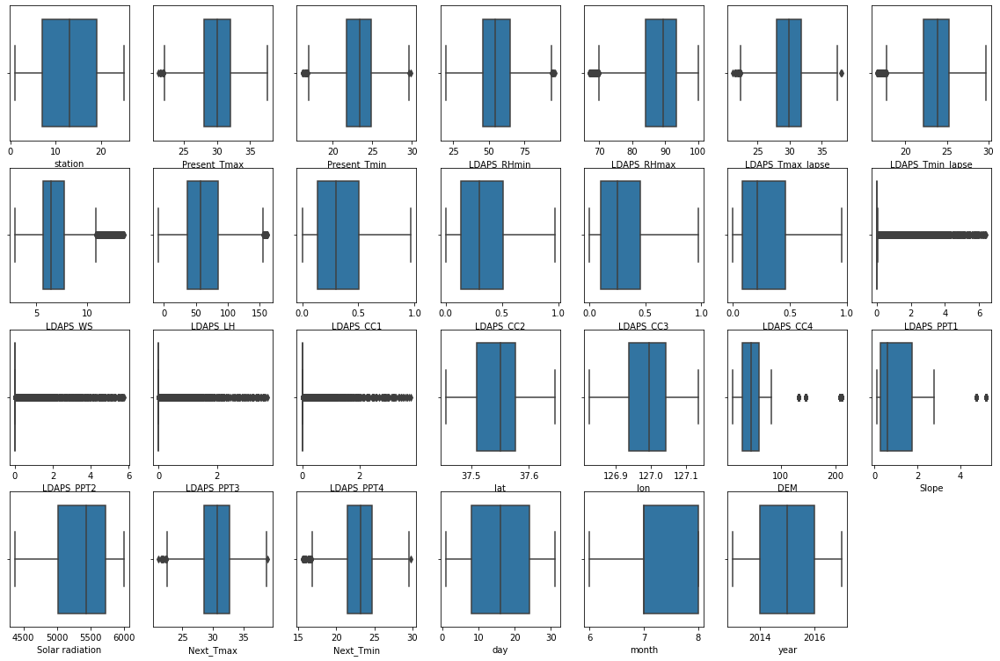

In [106]:
# Chekcing Outlier and skeweness
# let's see how data is distributed for every column
plt.figure(figsize=(20,13), facecolor='white')
plotnumber = 1

for columns in new_data:
    if plotnumber<=28 :     # as there are 28 columns in the data
        ax = plt.subplot(4,7,plotnumber)
        sns.boxplot(new_data[columns])
    plotnumber+=1
plt.show()

In [107]:
# we see that skewness present in datasset

In [108]:
#Removing skewness
for col in new_data.columns:
    if new_data[col].dtypes!="object":
        if new_data.skew().loc[col]>0.55:
            new_data[col]=np.log1p(new_data[col])
        if new_data.skew().loc[col]<-0.55:
            new_data[col]=np.square(new_data[col])
new_data.skew()

station             0.002792
Present_Tmax       -0.273950
Present_Tmin       -0.227590
LDAPS_RHmin         0.305740
LDAPS_RHmax        -0.520389
LDAPS_Tmax_lapse   -0.110448
LDAPS_Tmin_lapse   -0.386322
LDAPS_WS            0.469817
LDAPS_LH           -0.280559
LDAPS_CC1           0.324684
LDAPS_CC2           0.500911
LDAPS_CC3           0.435205
LDAPS_CC4           0.492761
LDAPS_PPT1          2.708722
LDAPS_PPT2          3.575349
LDAPS_PPT3          4.164393
LDAPS_PPT4          4.554634
lat                 0.108251
lon                -0.275508
DEM                 0.450845
Slope               0.849480
Solar radiation    -0.505353
Next_Tmax          -0.270929
Next_Tmin          -0.238547
day                 0.001007
month              -0.192910
year                0.010998
dtype: float64

In [109]:
new_data.isna().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
day                 0
month               0
year                0
dtype: int64

In [110]:
new_data.dropna(inplace=True)

In [111]:
# Let's split our dataset into Features and label
x=new_data.drop(columns=["Next_Tmax","Next_Tmin"])
y_max=new_data[["Next_Tmax"]]
y_min=new_data[["Next_Tmin"]]

In [112]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_scaler=scaler.fit_transform(x)

In [113]:
# Apply Dimenision reduction technique
from sklearn.decomposition import PCA
pca =PCA()
pca.fit_transform(X_scaler)

array([[ 3.32616659e-01,  2.96939505e+00, -2.86350419e+00, ...,
         1.23481056e-01,  3.10454341e-01,  2.60764984e-01],
       [-5.06984158e-01,  9.77575394e-01, -1.76275037e+00, ...,
         1.48444788e-01,  2.48325259e-01,  3.46162221e-01],
       [-7.84313296e-01, -3.68509572e-02, -1.11393316e+00, ...,
         1.30975505e-01,  2.78973483e-01,  3.25450317e-01],
       ...,
       [-2.73881116e+00,  3.39780931e+00,  4.42254935e+00, ...,
        -4.68038386e-01,  6.90118232e-01,  1.46025801e-03],
       [-2.88827810e+00,  3.15224228e+00,  4.48125141e+00, ...,
        -4.40317995e-01,  5.54360784e-01,  1.19371453e-02],
       [-2.88310589e+00,  3.03894217e+00,  4.61954273e+00, ...,
        -2.32907481e-01,  2.37413491e-01, -1.67622955e-02]])

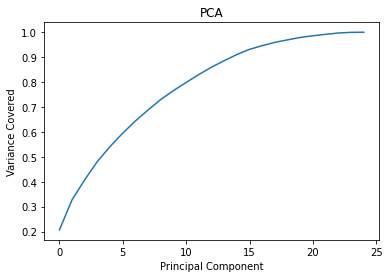

In [114]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Component')
plt.ylabel('Variance Covered')
plt.title("PCA")
plt.show()

In [115]:
pca=PCA(n_components=24)
new_pcomp=pca.fit_transform(X_scaler)
princi_comp=pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24'])
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24
0,0.332617,2.969395,-2.863504,-0.992862,-0.366263,-0.105202,-0.639524,-0.204176,1.697180,-2.240507,...,0.510379,-0.242141,0.363731,0.404006,0.148496,-0.369657,0.458262,-0.054531,0.123481,0.310454
1,-0.506984,0.977575,-1.762750,-1.753721,0.548934,-1.674888,-0.668692,0.060719,1.557554,-2.236504,...,0.336947,-0.148381,0.111002,0.811759,0.464432,0.337419,0.033733,-0.285223,0.148445,0.248325
2,-0.784313,-0.036851,-1.113933,-2.351967,-0.024579,-1.458782,-1.589601,0.654048,1.661245,-2.115336,...,0.127349,-0.016885,-0.214359,1.043553,-0.069974,-0.004144,0.061345,-0.140222,0.130976,0.278973
3,-0.085821,1.411351,-2.726509,-0.802521,0.697412,-1.444135,-0.479549,-0.380633,1.692869,-2.334154,...,0.985900,-0.254903,-0.116748,0.797687,-0.457761,0.372132,-0.562362,-0.203343,0.174926,0.058059
4,-0.446791,1.084665,-1.623905,-1.577591,0.629729,-1.833834,-0.008850,0.054027,1.874354,-1.632583,...,-1.054452,0.157116,-0.070296,0.641293,0.314347,-0.263287,-0.240489,-0.219370,-0.090430,0.237108
5,-0.552595,0.159001,-1.048034,-2.176807,0.016266,-0.555065,-0.584366,0.016829,1.838895,-1.809544,...,-0.727784,0.110720,-0.141238,1.036808,0.122729,-0.138248,0.595591,0.108705,-0.009851,0.132485
6,-0.212357,-0.656080,-0.404267,-2.555994,1.319980,-0.825879,1.084218,-1.197875,1.320439,-2.861693,...,0.316191,-0.948018,1.603523,0.645850,-0.447070,-0.739013,-0.220449,0.189403,0.153892,0.258120
7,-0.294204,0.001635,-0.745381,-2.334175,-0.689650,1.267686,-0.600263,-0.645567,1.886859,-1.678388,...,-0.005245,-0.421031,0.843472,1.257139,-0.459054,-0.362133,-0.325074,-0.053686,0.199593,0.052216
8,-0.012663,0.364262,-0.377058,-2.668033,0.165356,0.927101,0.618831,-1.148531,1.510688,-2.136548,...,0.107183,-0.689693,1.388701,0.801850,0.329364,-0.262960,0.348701,0.029315,0.240004,-0.026948
9,0.400217,2.326707,-1.875235,-1.350182,-1.260268,2.228803,-0.461016,-0.798221,2.124898,-1.025340,...,-0.107679,-0.194011,0.653118,1.165772,0.231010,0.087637,-0.371501,-0.307221,0.365153,0.083459


In [116]:
#Next_Tmax - The next-day maximum air temperature (Â°C)

In [117]:
# To find the best random state using Linear Regressor model
maxAccu=0
maxRS=0

maxR2_Score=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(princi_comp,y_max,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(x_train, y_train)
    predrf = LR.predict(x_test)
    score = r2_score(y_test, predrf)
    if score>maxR2_Score:
        maxR2_Score=score
        maxRS=i
print("Best accuracy is",maxR2_Score," on Random_state ",maxRS)

Best accuracy is 0.7674937348937789  on Random_state  43


In [118]:
x_train,x_test,y_train,y_test=train_test_split(princi_comp,y_max,test_size=.30,random_state=maxRS)

In [119]:
model=[LinearRegression(),RandomForestRegressor(),DecisionTreeRegressor(),KNeighborsRegressor(),GradientBoostingRegressor(),Ridge(),SVR()]

In [120]:
for m in model:
    print("*******************************************************************************")
    
    print('accuracy score for ->', m)
    
    m.fit(x_train,y_train)
    
    pred = m.predict(x_test)
    
    print("R2 Score:                ", r2_score(y_test,pred))
    
    print("Mean Absolute Error:     ", mean_absolute_error(y_test,pred))
    
    print("Mean Squared error:      ", mean_squared_error(y_test,pred))
    
    print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,pred)))
    
    score=cross_val_score(m,x,y_max,cv=5)
    
    print(score)
    
    print("cross validation score:  ", abs(score.mean()))
    
    print("Difference between R2 score and cross validatio score is -> ",r2_score(y_test,pred)-abs(score.mean()))
    
    print("--------------------------------**********************--------------------------------------")

*******************************************************************************
accuracy score for -> LinearRegression()
R2 Score:                 0.7674937348937789
Mean Absolute Error:      1.0844424315424326
Mean Squared error:       2.033094519433955
Root Mean Squared Error:  1.425866234761857
[0.56995107 0.66309294 0.65843895 0.69676185 0.52848234]
cross validation score:   0.6233454306928801
Difference between R2 score and cross validatio score is ->  0.14414830420089886
--------------------------------**********************--------------------------------------
*******************************************************************************
accuracy score for -> RandomForestRegressor()
R2 Score:                 0.8468916715906291
Mean Absolute Error:      0.869869922630561
Mean Squared error:       1.3388185614119925
Root Mean Squared Error:  1.1570732740029874
[0.72810225 0.65595356 0.64605601 0.71753814 0.56526011]
cross validation score:   0.6625820152167241
Difference between

In [121]:
# GradientBoostingRegressor give best score with least difference 79.9

In [122]:
# Now 

In [123]:
from sklearn.model_selection import GridSearchCV
params={'n_estimators':[500,1000,2000],
             'learning_rate':[.001,0.01,.1],
             'max_depth':[1,2,4],
             'subsample':[.5,.75,1]}

In [124]:
gridsearch = GridSearchCV(GradientBoostingRegressor(), param_grid=params,cv = 3, n_jobs = -1)

In [125]:
gridsearch.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 2, 4],
                         'n_estimators': [500, 1000, 2000],
                         'subsample': [0.5, 0.75, 1]})

In [126]:
print(gridsearch.best_params_)

{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 2000, 'subsample': 0.5}


In [127]:
gbr = gridsearch.best_estimator_

In [128]:
gbr.fit(x_train,y_train)

GradientBoostingRegressor(max_depth=4, n_estimators=2000, subsample=0.5)

In [129]:
print(gbr.score(x_test,y_test))

0.8768488820731922


In [130]:
y_pred =gbr.predict(x_test)

In [131]:
accuracy = r2_score(y_test,y_pred)

In [132]:
print(accuracy)

0.8768488820731922


In [ ]:
# Hyperaparameter tunning of GradientBoostingRegressor givr 87.6% accuracy

# Next_Tmin - The next-day minimum air temperature (Â°C)

In [133]:
# To find the best random state using Linear Regressor model
maxAccu=0
maxRS=0

maxR2_Score=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(princi_comp,y_min,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(x_train, y_train)
    predrf = LR.predict(x_test)
    score = r2_score(y_test, predrf)
    if score>maxR2_Score:
        maxR2_Score=score
        maxRS=i
print("Best accuracy is",maxR2_Score," on Random_state ",maxRS)

Best accuracy is 0.8359831050459388  on Random_state  24


In [134]:
# To find the best random state using Linear Regressor model
maxAccu=0
maxRS=0

maxR2_Score=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(princi_comp,y_min,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(x_train, y_train)
    predrf = LR.predict(x_test)
    score = r2_score(y_test, predrf)
    if score>maxR2_Score:
        maxR2_Score=score
        maxRS=i
print("Best accuracy is",maxR2_Score," on Random_state ",maxRS)

Best accuracy is 0.8359831050459388  on Random_state  24


In [136]:
x_train,x_test,y_train,y_test=train_test_split(princi_comp,y_min,test_size=.30,random_state=maxRS)
model=[LinearRegression(),RandomForestRegressor(),DecisionTreeRegressor(),KNeighborsRegressor(),GradientBoostingRegressor(),Ridge(),SVR()]

for m in model:
    print("*******************************************************************************")
    
    print('accuracy score of ->', m)
    
    m.fit(x_train,y_train)
    
    pred = m.predict(x_test)
    
    print("R2 Score:                ", r2_score(y_test,pred))
    
    print("Mean Absolute Error:     ", mean_absolute_error(y_test,pred))
    
    print("Mean Squared error:      ", mean_squared_error(y_test,pred))
    
    print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,pred)))
    
    score=cross_val_score(m,x,y_min,cv=5)
    
    print(score)
    
    print("cross validation score:  ", abs(score.mean()))
    
    print("Difference between R2 score and cross validatio score is -> ",r2_score(y_test,pred)-abs(score.mean()))
    
    print("--------------------------------**********************--------------------------------------")

*******************************************************************************
accuracy score of -> LinearRegression()
R2 Score:                 0.8359831050459388
Mean Absolute Error:      0.7663822890072829
Mean Squared error:       0.9535410815769814
Root Mean Squared Error:  0.9764942813846794
[0.716996   0.655804   0.78610377 0.82923242 0.81419   ]
cross validation score:   0.7604652365684632
Difference between R2 score and cross validatio score is ->  0.07551786847747555
--------------------------------**********************--------------------------------------
*******************************************************************************
accuracy score of -> RandomForestRegressor()
R2 Score:                 0.8709404711873948
Mean Absolute Error:      0.6717712765957448
Mean Squared error:       0.7503102819148938
Root Mean Squared Error:  0.8662045266072521
[0.69408564 0.68554373 0.80264476 0.82268516 0.83601993]
cross validation score:   0.7681958439802313
Difference betwee

In [ ]:
# After Hyperaparameter tunning of GradientBoostingRegressor givr 85% accuracy

In [137]:
from sklearn.model_selection import GridSearchCV
params={'n_estimators':[500,1000,2000],
             'learning_rate':[.001,0.01,.1],
             'max_depth':[1,2,4],
             'subsample':[.5,.75,1]}

In [138]:
gridsearch = GridSearchCV(GradientBoostingRegressor(), param_grid=params,cv = 3, n_jobs = -1)

In [139]:
gridsearch.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 2, 4],
                         'n_estimators': [500, 1000, 2000],
                         'subsample': [0.5, 0.75, 1]})

In [140]:
print(gridsearch.best_params_)

{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 2000, 'subsample': 0.75}


In [141]:
gbr = gridsearch.best_estimator_

In [142]:
gbr.fit(x_train,y_train)

GradientBoostingRegressor(max_depth=4, n_estimators=2000, subsample=0.75)

In [143]:
print(gbr.score(x_test,y_test))

0.908059110676513


In [144]:
y_pred =gbr.predict(x_test)

In [145]:
accuracy = r2_score(y_test,y_pred)

In [146]:
print(accuracy)

0.908059110676513


In [ ]:
#After Hyperaparameter tunning of GradientBoostingRegressor give 90.8% accuracy

In [147]:
#Saving the model
import joblib 
joblib.dump(gbr,'Temperature')

['Temperature']